# Importing packages

In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
from numpy import load
import scipy as sp
import matplotlib.pyplot as plt

from scipy import signal
from scipy.signal import welch


from scipy.signal import butter,filtfilt
import plotly.graph_objects as go

In [2]:
import warnings # Ignore alert messages
warnings.simplefilter(action='ignore', category=FutureWarning)

np.seterr(divide='ignore')

{'divide': 'warn', 'over': 'warn', 'under': 'ignore', 'invalid': 'warn'}

In [3]:
plt.rcParams.update({
    'font.size': 18,
    'axes.linewidth':2,
    'axes.titlesize': 20,
    'lines.linewidth' : 1.5,
    'lines.markersize' : 10,
    'figure.figsize': (30,8),
    'xtick.labelsize': 15, 
    'ytick.labelsize': 15,
    'xtick.minor.size': 5.0,
    'ytick.minor.size': 5.0,
    'ytick.major.size': 6.0,
    'ytick.major.size': 6.0,
    'font.family': 'Arial',
    'legend.fontsize':14,
    'axes.labelsize':20,
    'axes.grid':True,
    'axes.grid.which' : 'both'
})

In [4]:
from FRA_class import FRA_irregularities

# Example of usage - FRA irregularities with wavelength between 3m and 25m

In [5]:
df = pd.read_excel('data/Arbitrary_irregularities.xlsx',header=0)
df_fra3 = pd.read_csv('data/FRA3.csv',header=0)
df_fra6 = pd.read_csv('data/FRA6.csv',header=0)

(1000.0, 1100.0)

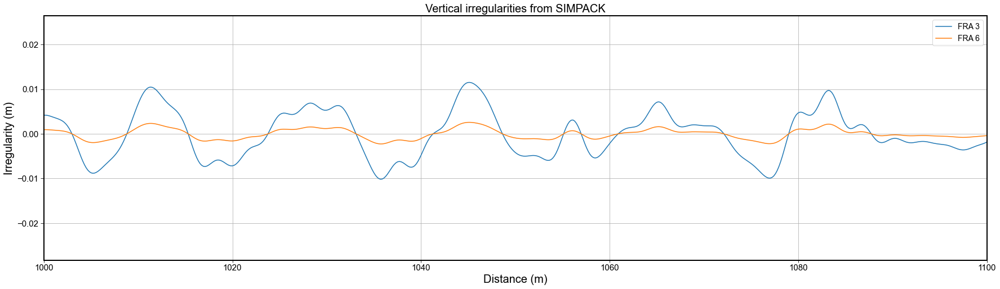

In [6]:
plt.figure()
plt.plot(df_fra3['distance'],df_fra3['right vert irreg'],label='FRA 3')
plt.plot(df_fra6['distance'],df_fra6['right vert irreg'],label='FRA 6')

plt.title('Vertical irregularities from SIMPACK')
plt.xlabel('Distance (m)')
plt.ylabel('Irregularity (m)')
plt.legend()

plt.xlim([1000,1100])

In [7]:
def Welch_PSD(signal,fs,window_size_frac=0.3,overlap_frac=0.8):
    
    #fs = sampling frequency - samples in 1 meter
    
    segment_size = np.int32(window_size_frac*len(signal)) 
    fft_size = 2 ** (int(np.log2(segment_size)) + 1) # round up to next highest power of 2 - used for zero padding
    
    overlap_size = overlap_frac*segment_size

    f, welch_coef = welch(x=signal, 
                            fs=fs,
                            nperseg=segment_size, 
                            noverlap=overlap_size,
                            nfft=fft_size,
                            return_onesided=True,
                            scaling='density',
                            detrend='constant',
                            window='hann',
                            average='mean')
    
    return f,welch_coef

def butter_lowpass_filter(data, cutoff, fs, order,nyq=5):
    normal_cutoff = cutoff / nyq
    # Get the filter coefficients 
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    y = filtfilt(b, a, data)
    return y

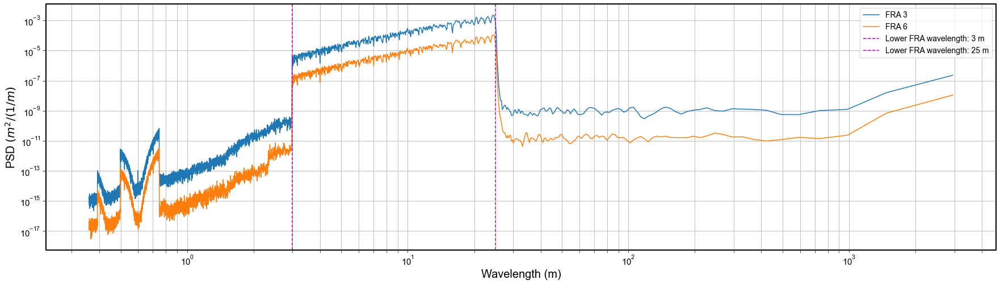

In [8]:
ax,fig = plt.subplots(1,1,figsize=(30,8))

# PSD using Welch's method
f,welch_coef = Welch_PSD(df['V_L'],fs=1/0.14) 
f_fra3,welch_coef_fra3 = Welch_PSD(df_fra3['right vert irreg'],fs=1/0.18)
f_fra6,welch_coef_fra6 = Welch_PSD(df_fra6['right vert irreg'],fs=1/0.18)


# Plotting the PSDs
plt.plot(1/f_fra3,welch_coef_fra3,label='FRA 3')
plt.plot(1/f_fra6,welch_coef_fra6,label='FRA 6')


plt.xlabel('Wavelength (m)')
plt.ylabel('PSD $(m^2/(1/m)$')
plt.xscale('log')
plt.yscale('log')

plt.axvline(3, label='Lower FRA wavelength: {} m'.format(3),color='m',linestyle='--')
plt.axvline(25, label='Lower FRA wavelength: {} m'.format(25),color='m',linestyle='--')
plt.legend()

## Filtering the signals

In [9]:
# Filter the data, and plot both the original and filtered signals.

# cutoff - desired cutoff frequency of the filter, Hz ,
# fs - sampling rate in Hz

y = butter_lowpass_filter(data=welch_coef, cutoff=0.4, fs=1/0.14, order=4)
y3 = butter_lowpass_filter(data=welch_coef_fra3, cutoff=0.4, fs=1/0.18, order=4)
y6 = butter_lowpass_filter(data=welch_coef_fra6, cutoff=0.4, fs=1/0.18, order=4)

fig = go.Figure()
fig.add_trace(go.Scatter(
            x = df['Distance'],
            y = welch_coef,
            line =  dict(shape =  'spline' ),
            name = 'Original signal'
            ))

fig.add_trace(go.Scatter(
            x = df['Distance'],
            y = y,
            line =  dict(shape =  'spline' ),
            name = 'Filtered signal'
            ))

fig.update_xaxes(type="log")
fig.update_yaxes(type="log")

In [10]:
fig = go.Figure()
fig.add_trace(go.Scatter(
            x = df_fra3['distance'],
            y = welch_coef_fra3,
            line =  dict(shape =  'spline' ),
            name = 'Original signal'
            ))

fig.add_trace(go.Scatter(
            x = df_fra3['distance'],
            y = y3,
            line =  dict(shape =  'spline' ),
            name = 'Filtered signal'
            ))

fig.update_xaxes(type="log")
fig.update_yaxes(type="log")

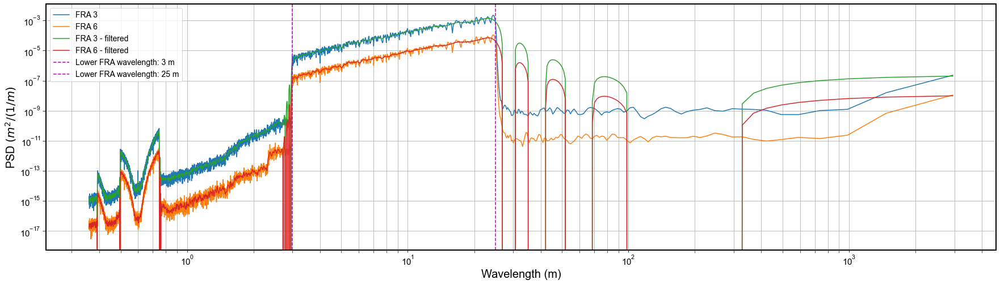

In [11]:
ax,fig = plt.subplots(1,1,figsize=(30,8))

plt.plot(1/f_fra3,welch_coef_fra3,label='FRA 3')
plt.plot(1/f_fra6,welch_coef_fra6,label='FRA 6')
plt.plot(1/f_fra3,y3,label='FRA 3 - filtered')
plt.plot(1/f_fra6,y6,label='FRA 6 - filtered')

plt.xlabel('Wavelength (m)')
plt.ylabel('PSD $(m^2/(1/m)$')
plt.xscale('log')
plt.yscale('log')

plt.axvline(3, label='Lower FRA wavelength: {} m'.format(3),color='m',linestyle='--')
plt.axvline(25, label='Lower FRA wavelength: {} m'.format(25),color='m',linestyle='--')

plt.legend()

## FRA class - plotting example

Step 1) Import your dataset

Step 2) Use our function "Welch_PSD" to calculate the PSD of the signal (look at scipy's Welch package for more info)

Step 3) Apply filter (if you want) using our function "butter_lowpass_filter"

Step 4) Plot your vectors below with the generated PSD functions.

In [12]:
# Generate the FRA curves

FRA = FRA_irregularities() # Class responsible for creating the FRA irregularities (FRA_class.py)
wave,omega,vert,lat=FRA._create_PSD(class_list=[6,5,4,3]) # wavelength domain, spatial angular frequency domain, vertical FRA, lateral FRA

Classes [6, 5, 4, 3] were created


In [13]:
# Import your files here and plot below. Use the Welch_PSD function first to obtain the spatial frequency vector and PSD values to plot.




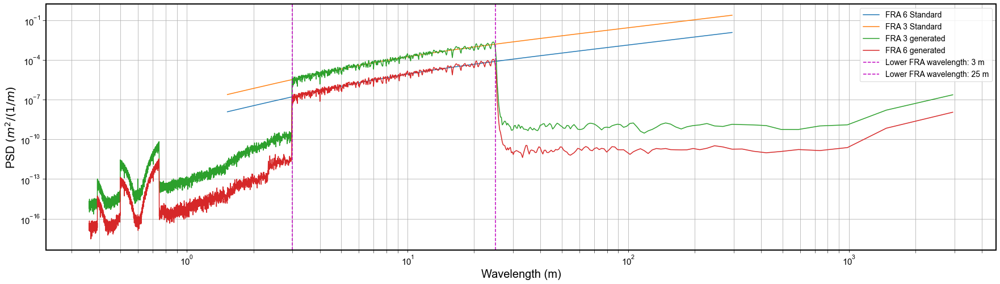

In [14]:
#This example plots only vertical irregularities

plt.plot(wave,vert[0],label='FRA 6 Standard')
#plt.plot(wave,vert[1],label='FRA 5 Standard')
#plt.plot(wave,vert[2],label='FRA 4 Standard')
plt.plot(wave,vert[3], label='FRA 3 Standard')

plt.plot(1/f_fra3,welch_coef_fra3,label='FRA 3 generated')
plt.plot(1/f_fra6,welch_coef_fra6,label='FRA 6 generated')

#plt.plot(1/f_fra3,y3,label='FRA 3 - filtered')
#plt.plot(1/f_fra6,y6,label='FRA 6 - filtered')

plt.xlabel('Wavelength (m)')
plt.ylabel('PSD $(m^2/(1/m)$')
plt.xscale('log')
plt.yscale('log')


plt.axvline(3, label='Lower FRA wavelength: {} m'.format(3),color='m',linestyle='--')
plt.axvline(25, label='Lower FRA wavelength: {} m'.format(25),color='m',linestyle='--')

#plt.xlim([2,30])
#plt.ylim([10e-10,10e-3])
plt.legend()

# References

[1] - Track Data-Oriented Maintenance Intervention Limit Determination for Ballasted Light Rail Tracks through Multibody Simulations - Alcocer 

[2] - Improving Railway Track Maintenance Using Power Spectral Density (PSD) - Berawi 

[3] - https://community.sw.siemens.com/s/article/what-is-a-power-spectral-density-psd 

[4] - https://www.youtube.com/watch?v=YK1F0-3VvQI - explains welchs method 

[5] - https://docs.scipy.org/doc/numpy-1.10.1/reference/generated/numpy.random.randn.html 
